In [1]:
import sys
sys.path.append("..")

In [2]:
from inpainting.data.datasets import InpaintingDataset
from transformers import CLIPTokenizer
import torch
from diffusers import StableDiffusionInpaintPipeline
from inpainting.models.text_to_image.pipelines.pipeline_stable_diffusion_inpaint import FreestyleStableDiffusionInpaintPipeline
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import draw_segmentation_masks
from PIL import Image
import os

/home/nicola/miniconda3/envs/i-dream-my-painting/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/nicola/miniconda3/envs/i-dream-my-painting/lib/python3.12/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/nicola/miniconda3/envs/i-dream-my-painting/lib/python3.12/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::fla

In [3]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
pipe_freestyle = FreestyleStableDiffusionInpaintPipeline.from_pretrained(
    "../models/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
)
pipe_normal = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
)
pipe_hq = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
)
pipe_freestyle.to(device)
pipe_normal.to(device)
pipe_hq.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]/home/nicola/miniconda3/envs/i-dream-my-painting/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  6.29it/s]


StableDiffusionInpaintPipeline {
  "_class_name": "StableDiffusionInpaintPipeline",
  "_diffusers_version": "0.29.2",
  "_name_or_path": "stabilityai/stable-diffusion-2-inpainting",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [5]:
pipe_freestyle.load_lora_weights("../models/sd/rca/checkpoint-2884/pytorch_lora_weights.safetensors")
pipe_normal.load_lora_weights("../models/sd/base/checkpoint-2884/pytorch_lora_weights.safetensors")

In [6]:
freestyle_dataset = InpaintingDataset(
    data_dir="../data/mm_inp_dataset",
    tokenizer=pipe_freestyle.tokenizer,
    max_concepts=5,
    generator=torch.Generator(),
    shuffle_concepts=True,
    masked_area_threshold=0.65,
    resolution=512,
    freestyle=True,
    drop_caption_probability=0.0,
    texts_dir="../models/llava/multimask/preds",
    split="test",
)
freestyle_dataloader = torch.utils.data.DataLoader(
    dataset=freestyle_dataset,
    num_workers=8,
    batch_size=8,
    shuffle=False,
    worker_init_fn=lambda worker_id: freestyle_dataset.generator.manual_seed(
            42 + worker_id
    ),
    collate_fn=InpaintingDataset.collate_fn
)
normal_dataset = InpaintingDataset(
    data_dir="../data/mm_inp_dataset",
    tokenizer=pipe_normal.tokenizer,
    max_concepts=5,
    generator=torch.Generator(),
    shuffle_concepts=True,
    masked_area_threshold=0.65,
    resolution=512,
    freestyle=False,
    drop_caption_probability=0.0,
    texts_dir="../models/llava/multimask/preds",
    split="test",
)
normal_dataloader = torch.utils.data.DataLoader(
    dataset=normal_dataset,
    num_workers=8,
    batch_size=8,
    shuffle=False,
    worker_init_fn=lambda worker_id: normal_dataset.generator.manual_seed(
            42 + worker_id
    ),
    collate_fn=InpaintingDataset.collate_fn
)
true_dataset = InpaintingDataset(
    data_dir="../data/mm_inp_dataset",
    tokenizer=pipe_normal.tokenizer,
    max_concepts=5,
    generator=torch.Generator(),
    shuffle_concepts=True,
    masked_area_threshold=0.65,
    resolution=512,
    freestyle=False,
    drop_caption_probability=0.0,
    split="test",
)
true_dataloader = torch.utils.data.DataLoader(
    dataset=true_dataset,
    num_workers=8,
    batch_size=8,
    shuffle=False,
    worker_init_fn=lambda worker_id: true_dataset.generator.manual_seed(
            42 + worker_id
    ),
    collate_fn=InpaintingDataset.collate_fn
)

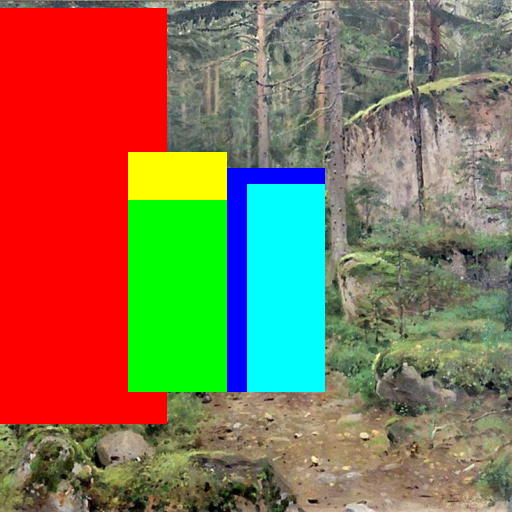

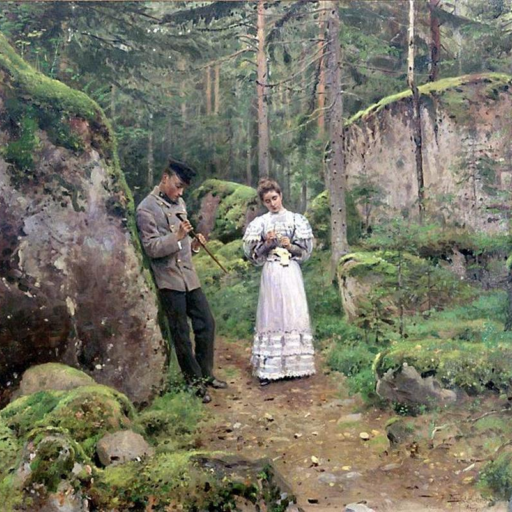

100%|██████████| 50/50 [00:01<00:00, 25.04it/s]


Freestyle


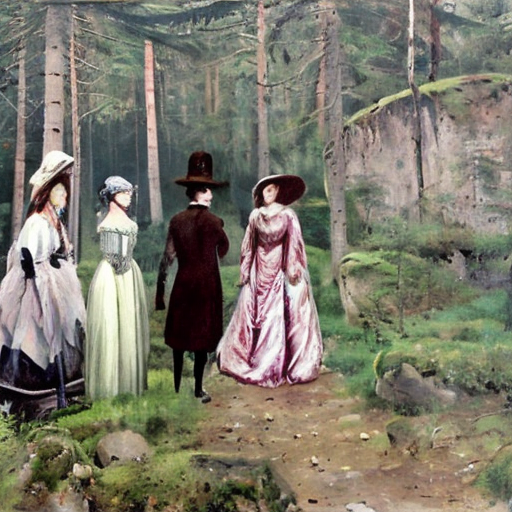

100%|██████████| 50/50 [00:01<00:00, 31.71it/s]

Normal


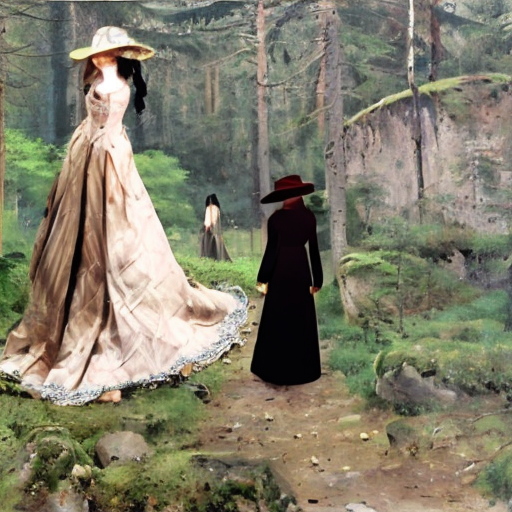

['a woman wearing a long, white dress with lace details, standing in a natural setting with trees in the background', 'a man and a woman in a forest setting', 'a man in a military uniform leaning against a rock, holding a rifle', 'a large rock formation with moss and lichen growth, and a person is partially visible on the right side, leaning against the rock', 'a person in a military uniform leaning against a rock, holding a cane']
['a woman wearing a long dress with a pattern, standing in a natural setting with trees and grass', 'a woman in a long dress, possibly from a historical or fantasy setting, standing in a natural environment with trees and foliage', 'a person wearing a hat and a long coat, standing in a forestlike setting with trees and foliage', 'a forest scene with tall trees, a person standing in the foreground, and a clearing in the background', 'a person wearing a long coat and a hat, standing in a natural setting with trees and grass']


100%|██████████| 50/50 [00:01<00:00, 41.18it/s]


High quality


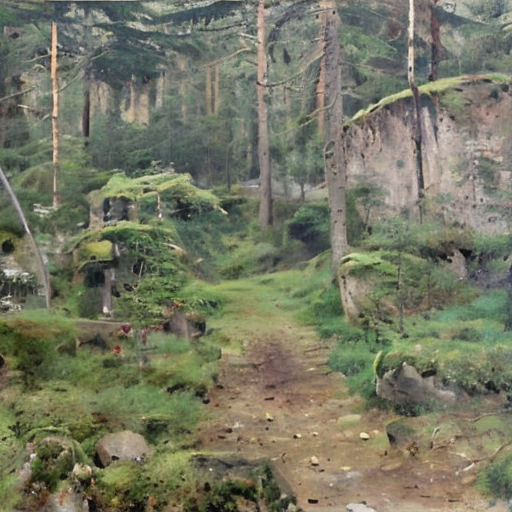

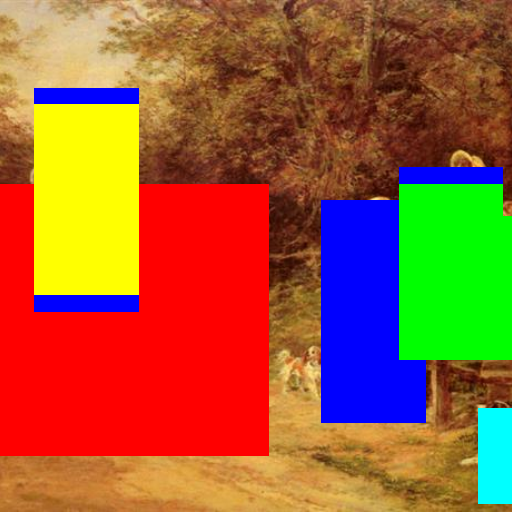

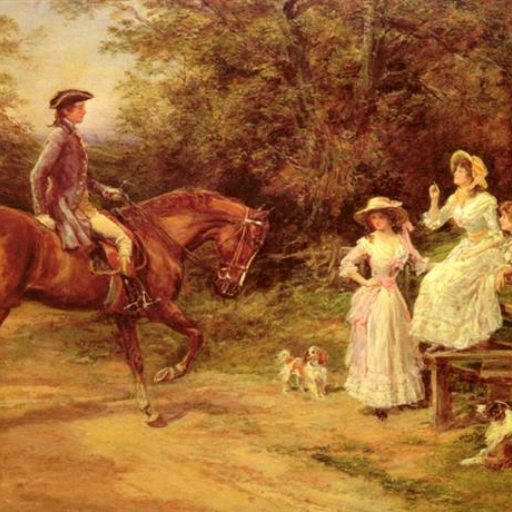

100%|██████████| 50/50 [00:01<00:00, 25.07it/s]


Freestyle


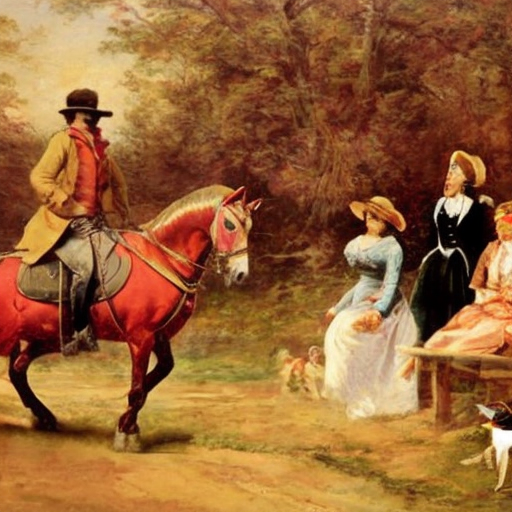

100%|██████████| 50/50 [00:01<00:00, 32.24it/s]

Normal


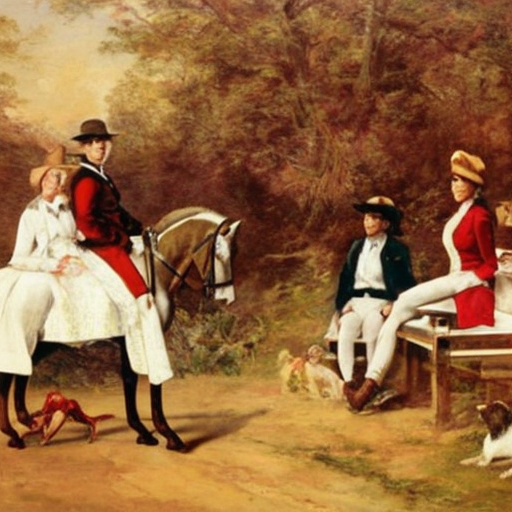

['two women in period clothing, one wearing a white dress with a pink bodice and the other in a white dress with a blue bodice, both sitting on a wooden bench', 'a person riding a brown horse', 'three separate scenes with people dressed in historical attire, likely from the 18th or 19th century', 'a person riding a horse, wearing a coat and hat, set against a landscape background', 'a dog lying down on a grassy area, with another dog partially visible in the background']
['a person wearing a white dress, sitting on a bench with a backdrop of a landscape', 'a person riding a horse, with the rider wearing a red jacket and the horse being brown', 'two women in a rural setting, one is seated and the other is standing, both dressed in traditional attire', 'a person wearing a red jacket and a hat, standing in a field with trees in the background', 'a dog with a white and brown coat, standing on a surface with a blurred background']


100%|██████████| 50/50 [00:01<00:00, 41.43it/s]


High quality


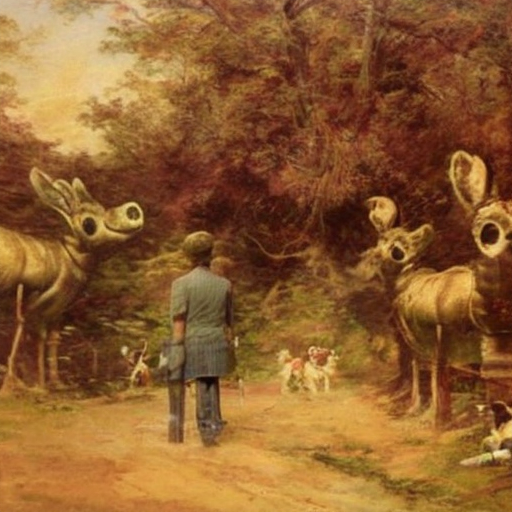

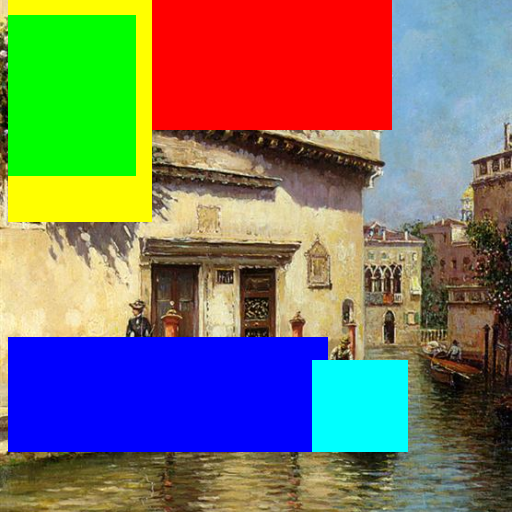

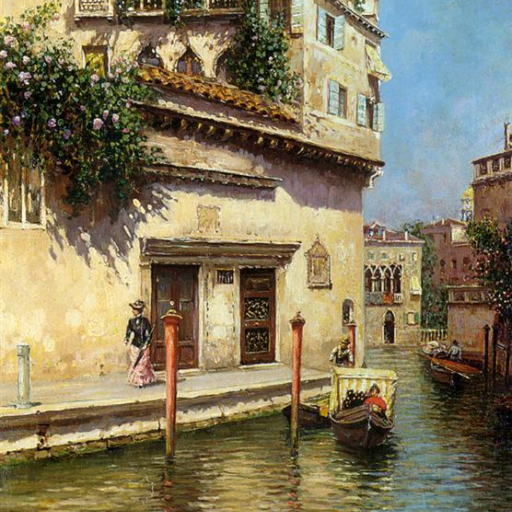

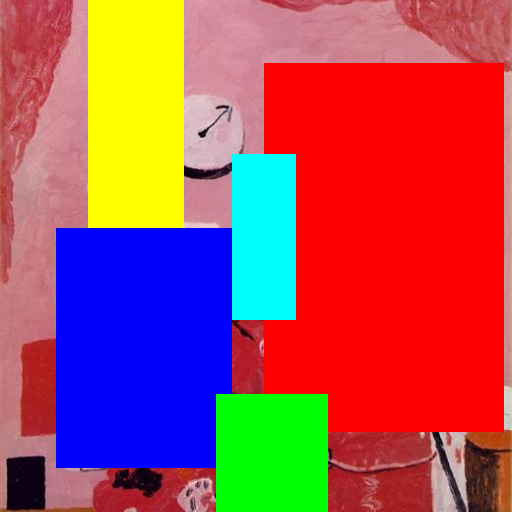

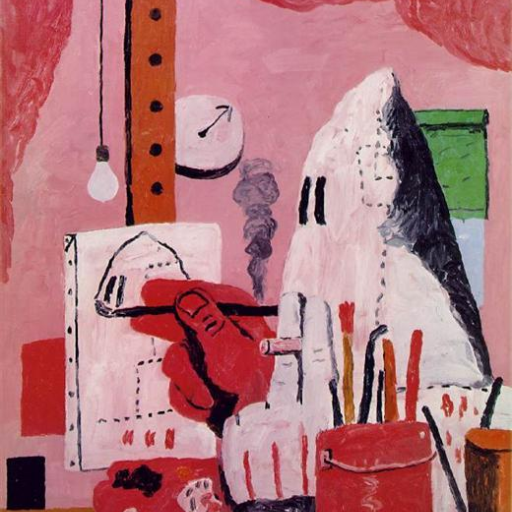

100%|██████████| 50/50 [00:01<00:00, 25.33it/s]

Freestyle


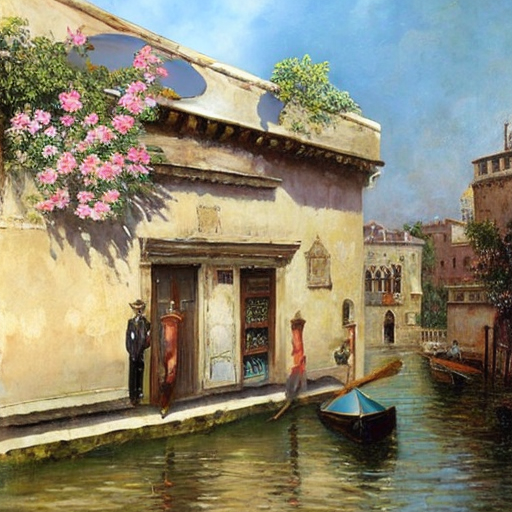

100%|██████████| 50/50 [00:01<00:00, 32.23it/s]

Normal


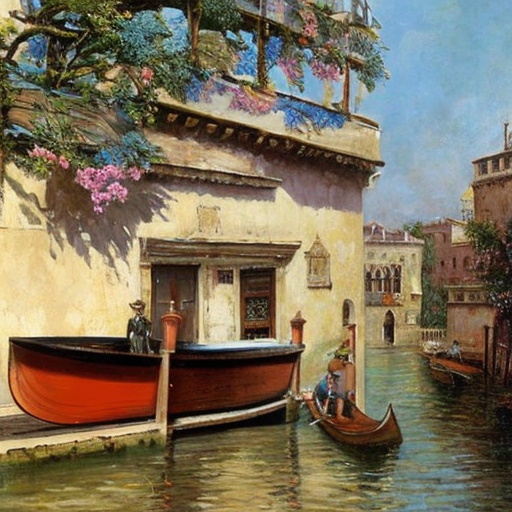

['a boat with a person inside, wearing a red shirt, and there are several objects in the boat, including what appears to be a fishing net', 'a dock with a boat, a person standing on the dock, and a building with a door and a window', 'a painting of a house with a window, partially obscured by a lush green bush with pink flowers', 'a collection of potted plants with green leaves and purple flowers, arranged in front of a building with a balcony and a window', 'a balcony with a railing, a window, and a plant']
['a boat with a curved hull, possibly a canoe or a small boat, with a person standing on the back', 'a bridge with a curved arch, set against a backdrop of a body of water with reflections and a distant shore', 'a painting of a tree with pink flowers, set against a backdrop of a building with a balcony', 'a tree with pink flowers in front of a building with a balcony', 'a blue sky with a few clouds, and there are buildings with arches and columns in the foreground']


100%|██████████| 50/50 [00:01<00:00, 41.73it/s]


High quality


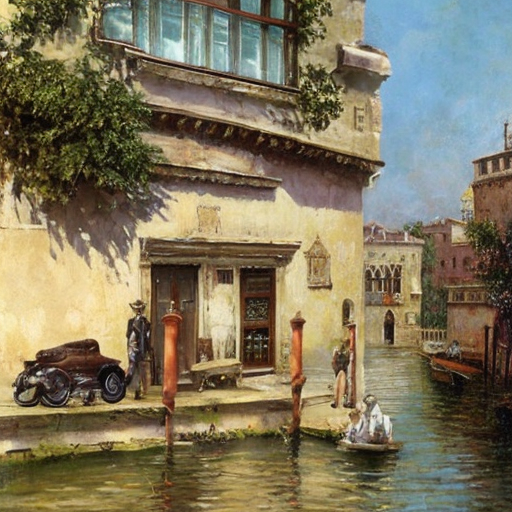

100%|██████████| 50/50 [00:02<00:00, 24.86it/s]

Freestyle


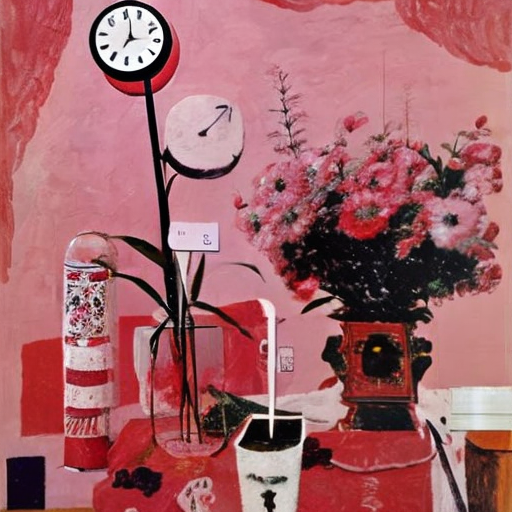

100%|██████████| 50/50 [00:01<00:00, 31.36it/s]

Normal


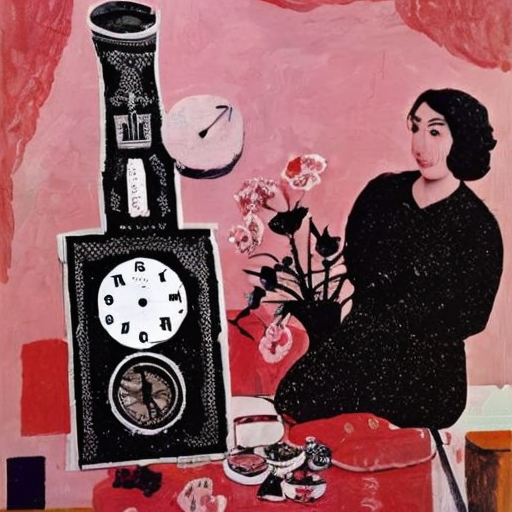

['a bowl with a red interior and a white exterior, placed on a surface with a dark background', 'two potted plants, one with a darker green leaf and the other with a lighter green leaf, set against a pink background', 'a clock with a red hand pointing to the number 12', 'a guitar with a black body and a brown neck, featuring a black pickguard and a white pickup', 'a white robe with a black collar and sleeves, placed on a surface with a green and red object in the background']
['a bowl with a black interior and a white exterior, placed on a surface with a red and white pattern', 'a bottle with a label that is partially obscured, and it appears to be a closeup of the bottle', 'a vase with a floral design, featuring red and white flowers, and it is placed on a surface with a pinkish hue', 'a clock with a white face and black numbers and hands, set against a pink background', 'a vase with a floral design, placed on a surface with a pinkish hue']


100%|██████████| 50/50 [00:01<00:00, 40.97it/s]


High quality


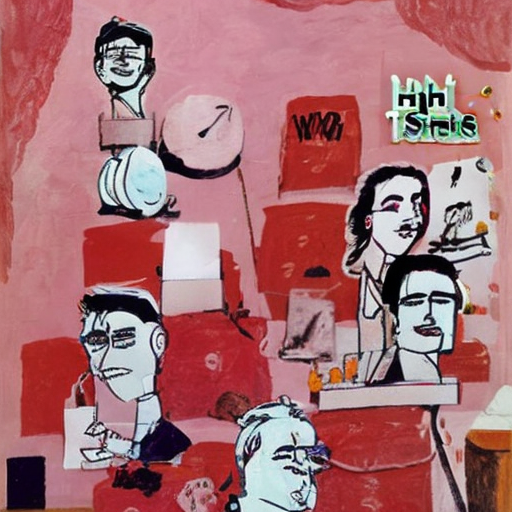

In [53]:
colors = {
    "red": (255, 0, 0),
    "blue": (0, 0, 255),
    "yellow": (255, 255, 0),
    "green": (0, 255, 0),
    "cyan": (0, 255, 255),
}
min_z = 40
max_z = 60

for z, (true_batch, freestyle_batch, normal_batch) in enumerate(
    zip(true_dataloader, freestyle_dataloader, normal_dataloader)
):
    if z < min_z:
        continue
    if z >= max_z:
        break
    for i, masked_pixel_values in enumerate(freestyle_batch["masked_pixel_values"]):
        masked_image = masked_pixel_values * 0.5 + 0.5
        image = freestyle_batch["pixel_values"][i] * 0.5 + 0.5
        if len(freestyle_batch["all_masks"][i]) == 5:
            cs = list(colors.values())
            all_masks = sorted(
                freestyle_batch["all_masks"][i], key=lambda x: x.sum(), reverse=True
            )
            for j, (text, mask) in enumerate(
                zip(freestyle_batch["texts"][i], all_masks)
            ):
                masked_image = draw_segmentation_masks(
                    masked_image, mask.bool(), alpha=1.0, colors=cs[j]
                )
            display(to_pil_image(masked_image))
            display(to_pil_image(image))
    for i in range(len(freestyle_batch["input_ids"])):
        if len(freestyle_batch["all_masks"][i]) == 5:
            res_freestyle = pipe_freestyle(
                input_ids=freestyle_batch["input_ids"][i].unsqueeze(0).to(device),
                image=freestyle_batch["pixel_values"][i].unsqueeze(0).to(device),
                mask_image=freestyle_batch["masks"][i].unsqueeze(0).to(device),
                freestyle_attention_mask=freestyle_batch["freestyle_attention_mask"][i].unsqueeze(0).to(device),
                freestyle_layout_mask=freestyle_batch["freestyle_layout_mask"][i].unsqueeze(0).to(device),
            )
            print("Freestyle")
            display(res_freestyle["images"][0])
            prompt_embeds = pipe_normal.text_encoder(normal_batch["input_ids"][i].unsqueeze(0).to(device))
            prompt_embeds = prompt_embeds[0]
            res_normal = pipe_normal(
                prompt_embeds=prompt_embeds,
                image=normal_batch["pixel_values"][i].unsqueeze(0).to(device),
                mask_image=normal_batch["masks"][i].unsqueeze(0).to(device),
            )
            print("Normal")
            display(res_normal["images"][0])
            print(true_batch["texts"][i])
            print(freestyle_batch["texts"][i])
            res_hq = pipe_hq(
                prompt="High quality",
                image=normal_batch["pixel_values"][i].unsqueeze(0).to(device),
                mask_image=normal_batch["masks"][i].unsqueeze(0).to(device),
            )
            print("High quality")
            display(res_hq["images"][0])